Nome:Chen Jiahao

RA:195673

Curso:Engenharia Elétrica Noturno



# Ex04 - Filtragem de Imagens

Nesta atividade vamos entender a operação de convolução e o uso da mesma para filtragem de imagens. Testaremos o uso de **filtros suavizantes**, usados para a remoção de ruído, e **filtros aguçantes**, usados para detecção de bordas.  

- **Filtros suavizantes:** são aqueles que removem a nitidez da imagem fazendo uma média, aritmética ou ponderada, na janela do núcleo. O filtro ponderado suavizante mais comum é o da gaussiana. Filtros suavizantes são muito utilizados para eliminar ruído de uma imagem.

- **Filtros aguçantes:** são aqueles que realçam as bordas da imagem. Alguns dos filtros aguçantes comuns são: Filtro de Sobel, Filtro de Prewitt, Filtro Laplaciano.

Veja mais no notebook sobre [Filtragem no domínio espacial](https://github.com/lrittner/Computacao-Visual/blob/master/tutoriais/07_Filtragem_no_dominio_espacial.ipynb)

In [448]:
# Importando as bibliotecas que serão utilizadas
import numpy as np
import matplotlib.image as mpimg
from PIL import Image
import matplotlib.pyplot as plt
import random

# Definindo o nome da pasta compartilhada
# IMPORTANTE: substitua "NOME_DA_PASTA_COMPARTILHADA" abaixo pelo nome correspondente
pasta_compartilhada = "P_IA905A_2024S1"

In [449]:
# Conexão do colab com o drive
from google.colab import drive
drive.mount('/content/gdrive')
path = f"gdrive/MyDrive/{pasta_compartilhada}/Dados/Ex04/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


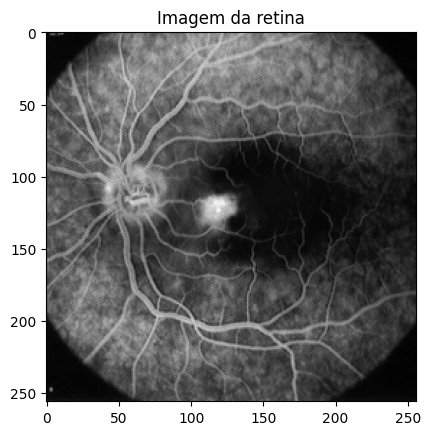

In [450]:
%matplotlib inline
f = mpimg.imread(path+'retina.tif')
plt.title('Imagem da retina')
plt.imshow(f,cmap='gray')

**ATENÇÃO** - as operações de filtragem alteram os valores e eles podem sair da faixa de 0 a 255. Portanto, fique atento à maneira como você está realizando as operações e visualizando os resultados. Algumas dicas:

- Uma boa prática é realizar as operações em ponto flutuante;
- Quando a visualização não corresponde ao esperado, desconfie que os valores sairam da escala e que os valores, de alguma maneira, estão sendo truncados.

## Parte 1 - Operação de convolução e filtro da média

### Exercício 1.1

Entenda o uso da operação de convolução e experimente usá-la para entender o filtro da média. Siga o seguinte roteiro:
- Crie uma imagem numérica pequena (7x7, por exemplo), crie um filtro de média (kernel 3x3) e use a função **convolve()** da biblioteca **scipy.ndimage** para realizar a filtragem. Verifique numericamente que a filtragem está correta;
- Repita a operação de filtragem na imagem da retina e visualize o resultado;
- Faça experimentos com a imagem da retina variando o tamanho do filtro e compare as imagens resultantes;
- Não se esqueça de comentar os métodos utilizados e resultados obtidos.

In [451]:
from scipy.ndimage import convolve, convolve1d

In [452]:
# Criação da máscara do filtro de média 3x3, onde cada elemento será divido por 9 para ser a média dos
# valores da máscara
k = np.ones((3,3))/(3*3)
print(f"Fitro de média 3x3\n {k}")

Fitro de média 3x3
 [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


[[255. 255. 255. 255. 255. 255. 255.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [255. 255. 255. 255. 255. 255. 255.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [255. 255. 255. 255. 255. 255. 255.]
 [  0.   0.   0.   0.   0.   0.   0.]
 [255. 255. 255. 255. 255. 255. 255.]]


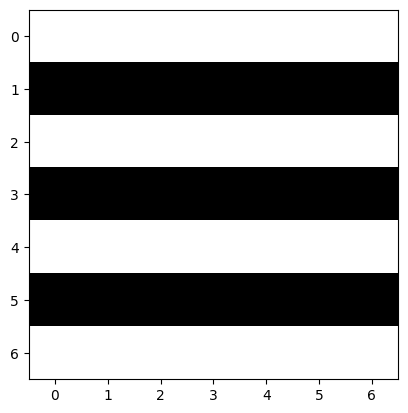

In [453]:
# Vamos criar uma imagem 7x7 listrada para realizar a operação de convolução
# com o filtro de média
img = np.zeros((7,7), dtype = 'float')
img[::2,:] = 255
print(img)
plt.imshow(img, cmap = 'gray',vmin=0, vmax=255);

[[170. 170. 170. 170. 170. 170. 170.]
 [170. 170. 170. 170. 170. 170. 170.]
 [ 85.  85.  85.  85.  85.  85.  85.]
 [170. 170. 170. 170. 170. 170. 170.]
 [ 85.  85.  85.  85.  85.  85.  85.]
 [170. 170. 170. 170. 170. 170. 170.]
 [170. 170. 170. 170. 170. 170. 170.]]
(7, 7)


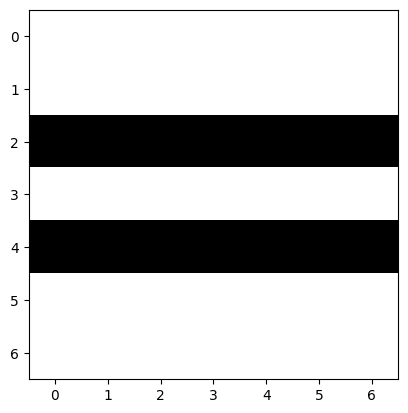

In [454]:
# A convolução de uma imagem listrada preto e branco de 0 a 255 nos retornou uma
# imagem com dois tons de cinza, de valor 170 e 85.
#
# Ambos os valores estão corretos pois nos píxeis centrais 255 possuem média 3*255/9
# e nos píxeis centrais 0, a média é 6*255/9.
#
# Note que as listras brancas superior e inferior ao contrário do esperado,
# após a convolução passaram a ter o mesmo valor que as listras pretas podemos supor
# que a função convolve() reflete os píxeis da imagem para remover o problema de borda.
# Verificando o shape da imagem, ela não diminuiu de tamanho.

img_media = convolve(img,k)
print(img_media)
print(img_media.shape)
plt.imshow(img_media, cmap = "gray");

[[ 56.67  85.    85.    85.    85.    85.    56.67]
 [113.33 170.   170.   170.   170.   170.   113.33]
 [ 56.67  85.    85.    85.    85.    85.    56.67]
 [113.33 170.   170.   170.   170.   170.   113.33]
 [ 56.67  85.    85.    85.    85.    85.    56.67]
 [113.33 170.   170.   170.   170.   170.   113.33]
 [ 56.67  85.    85.    85.    85.    85.    56.67]]


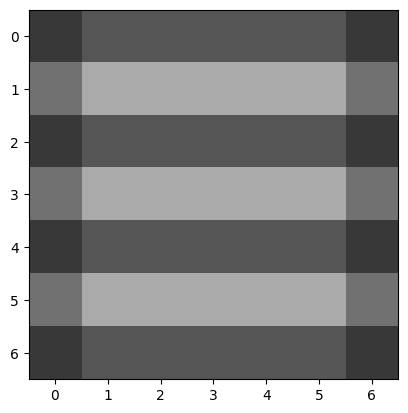

In [455]:
# Dito isso, a função convolve() oferece várias formas para resolver o problema de borda
# um exemplo é constante com o mode = 'constant' com cval = constante, neste caso 0, ou seja preto.
# portanto é esperado vizualizar bordas mais escuras. E consequentemente vemos que preserva o valor esperado
# para a listra branca na borda horizontal mas em contrapartida as bordas verticais possuem tom mais escuro.
# Vide os valores da imagem

img_media_2 = convolve(img,k,mode='constant')
print(np.around(img_media_2,2))
plt.imshow(img_media_2, cmap = 'gray', vmin = 0, vmax = 255);

[[  0.       5.3125  10.625   15.9375  21.25    26.5625  31.875 ]
 [ 37.1875  42.5     47.8125  53.125   58.4375  63.75    69.0625]
 [ 74.375   79.6875  85.      90.3125  95.625  100.9375 106.25  ]
 [111.5625 116.875  122.1875 127.5    132.8125 138.125  143.4375]
 [148.75   154.0625 159.375  164.6875 170.     175.3125 180.625 ]
 [185.9375 191.25   196.5625 201.875  207.1875 212.5    217.8125]
 [223.125  228.4375 233.75   239.0625 244.375  249.6875 255.    ]]


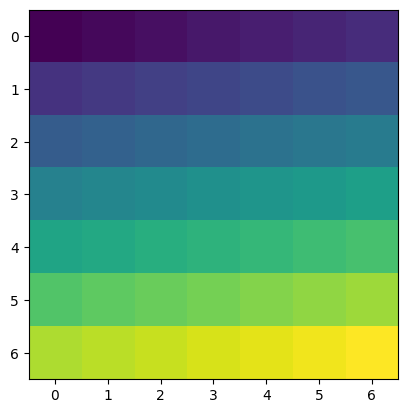

In [456]:
# Criação de uma imagem em degrade para vizualização colorida

img_colorida = np.linspace(0,255,num = 49).reshape((7,7))
print(img_colorida)
plt.imshow(img_colorida);

[[ 14.16666667  17.70833333  23.02083333  28.33333333  33.64583333
   38.95833333  42.5       ]
 [ 38.95833333  42.5         47.8125      53.125       58.4375
   63.75        67.29166667]
 [ 76.14583333  79.6875      85.          90.3125      95.625
  100.9375     104.47916667]
 [113.33333333 116.875      122.1875     127.5        132.8125
  138.125      141.66666667]
 [150.52083333 154.0625     159.375      164.6875     170.
  175.3125     178.85416667]
 [187.70833333 191.25       196.5625     201.875      207.1875
  212.5        216.04166667]
 [212.5        216.04166667 221.35416667 226.66666667 231.97916667
  237.29166667 240.83333333]]


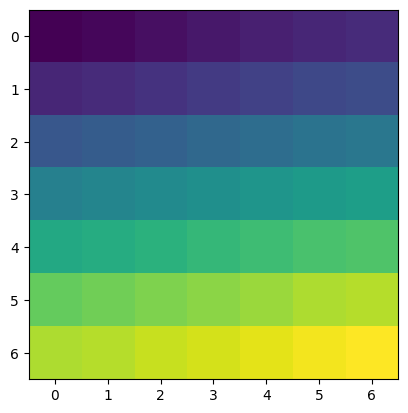

In [457]:
# Quando a imagem possui mais tons de cores podemos ver que não ocorre o problema anterior da imagem listrada
# Isto é a bordas superior e inferior horizontais mantiveram em tonalidade mais próximas a da original
# Neste caso a solução de refletir a imagem se mostrou mais eficiente.

img_colorida_media = convolve(img_colorida, k)
print(img_colorida_media)
plt.imshow(img_colorida_media);

[[  9.44444444  15.9375      19.47916667  23.02083333  26.5625
   30.10416667  21.25      ]
 [ 26.5625      42.5         47.8125      53.125       58.4375
   63.75        44.27083333]
 [ 51.35416667  79.6875      85.          90.3125      95.625
  100.9375      69.0625    ]
 [ 76.14583333 116.875      122.1875     127.5        132.8125
  138.125       93.85416667]
 [100.9375     154.0625     159.375      164.6875     170.
  175.3125     118.64583333]
 [125.72916667 191.25       196.5625     201.875      207.1875
  212.5        143.4375    ]
 [ 92.08333333 139.89583333 143.4375     146.97916667 150.52083333
  154.0625     103.88888889]]


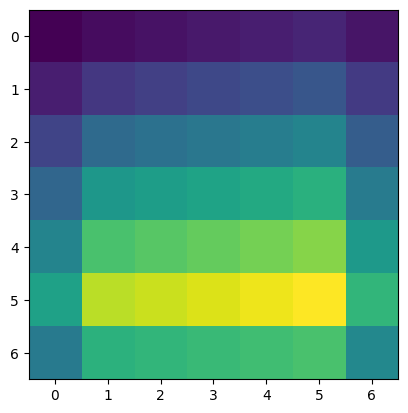

In [458]:
# Testando o mode constant para o caso degrade em colorido, vemos que o resultado ficou muito pior
# portanto podemos concluir que os modos de resolver o problema de borda possui sempre seu lado positivo e negativo
# dependendo da imagem que será tratada.

img_colorida_media2 = convolve(img_colorida, k, mode = 'constant')
print(img_colorida_media2)
plt.imshow(img_colorida_media2);

(256, 256)


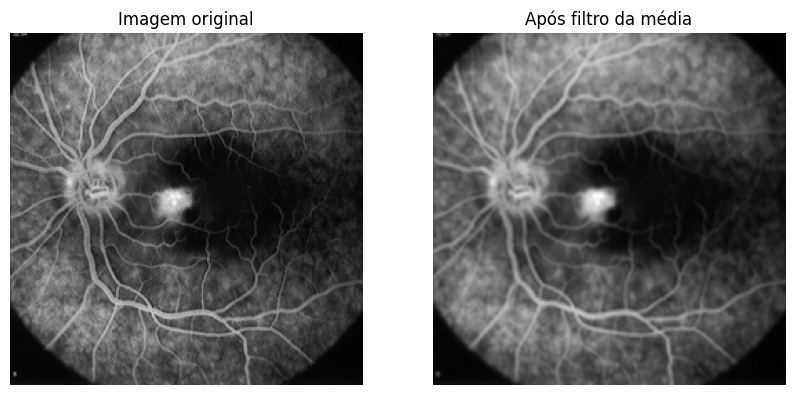

In [459]:
retina_media = convolve(f,k)
print(retina_media.shape)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title('Imagem original')
plt.imshow(f, cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.title('Após filtro da média')
plt.imshow(retina_media, cmap = 'gray')
plt.axis('off');

Vemos na imagem acima que o filtro de média está borrando a imagem levemente ocasionando na perca de detalhes principalmente de contorno como por exemplo na distinção entre a veia e o fundo da retina. Antes havia uma clara separação da veia, após a aplicação do filtro houve suavização do contorno pois há uma subta mudança de valor de intensidade que o filtro de média suaviza causando o efeito de borrado.

### Exercício 1.2

Repita a operação de filtragem, desta vez variando também o modo de tratamento de borda da função **convolve()** - '*reflect*', '*constant*', '*nearest*', '*mirror*', '*wrap*' - explicando as diferenças encontradas. Dica, você só conseguirá visualizar as diferenças se aumentar o tamanho da máscara (filtro).

In [460]:
# Vamos aumentar o kernel para 14x14
k = np.ones((14,14))/(14*14)

modes = ['reflect', 'constant', 'nearest', 'mirror', 'wrap']
retina_convolve = {}

for m in modes:
  retina_convolve[m] = convolve(f,k, mode = m)

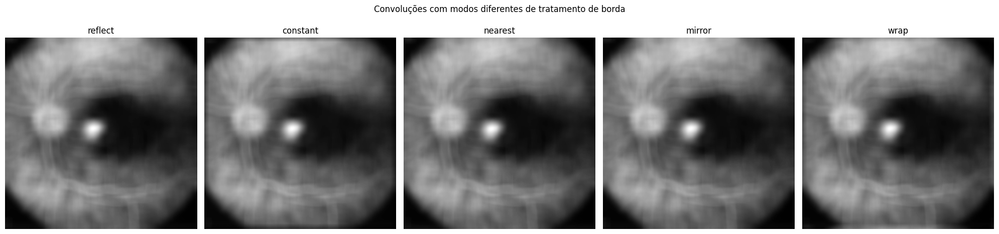

In [461]:
fig, axs = plt.subplots(1, 5, figsize = (20,5))
fig.suptitle("Convoluções com modos diferentes de tratamento de borda")
for n,m in enumerate(modes):
    plt.subplot(1, 5, 1+n)
    plt.imshow(retina_convolve[m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
fig.tight_layout()

In [462]:
# O filtro 14x14 não pareceu funcionar para evidenciar as diferenças entre os modos
# testaremos com um filtro de tamanho maior 50x50

k = np.ones((50,50))/(50*50)

modes = ['reflect', 'constant', 'nearest', 'mirror', 'wrap']
retina_convolve = {}

for m in modes:
  retina_convolve[m] = convolve(f,k, mode = m)

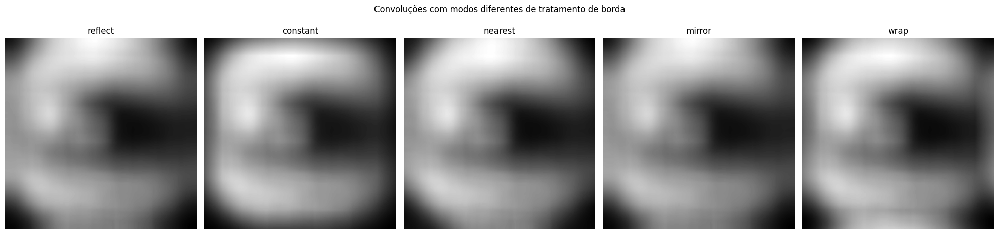

In [463]:
fig, axs = plt.subplots(1, 5, figsize = (20,5))
fig.suptitle("Convoluções com modos diferentes de tratamento de borda")
for n,m in enumerate(modes):
    plt.subplot(1, 5, 1+n)
    plt.imshow(retina_convolve[m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
fig.tight_layout()

Com máscara de 50x50 ja podemos começar a notar algumas diferenças no modo **constant** e modo **wrap**, perceba que parece ter um *frame* quadrado no centro dos dois modos citados, sendo mais evidente no modo **wrap**

In [464]:
# Vamos extrapolar para 100x100 para verificar se há mais diferenças para serem evidenciadas
k = np.ones((100,100))/(100*100)

modes = ['reflect', 'constant', 'nearest', 'mirror', 'wrap']
retina_convolve = {}

for m in modes:
  retina_convolve[m] = convolve(f,k, mode = m)

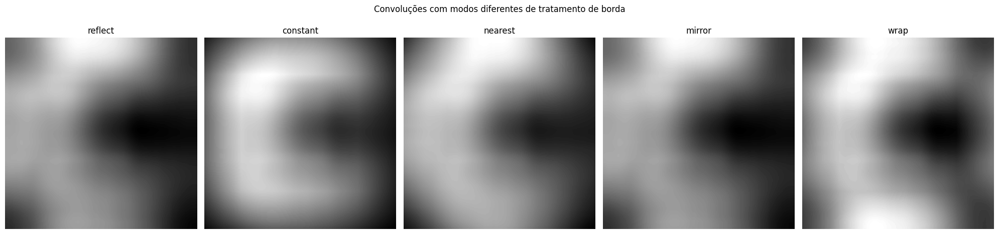

In [465]:
fig, axs = plt.subplots(1, 5, figsize = (20,5))
fig.suptitle("Convoluções com modos diferentes de tratamento de borda")
for n,m in enumerate(modes):
    plt.subplot(1, 5, 1+n)
    plt.imshow(retina_convolve[m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
fig.tight_layout()

Utilizando um filtro 100x100, o modo constant e reflect preservou melhor a borda preta do lado direito porém assim como o nearest, perdeu se o detalhe preto do centro da imagem. Em relação as pontas da imagem o modo reflect e mirror borraram mais em relação ao restante. Por fim o modo wrap foi o que manteve maior quantidade de branco e espalhado e o modo constant parece estar mais contido em torno das bordas

De acordo com a documentação, os modos tratam a borda da seguintes maneira:



*   Reflect - A imagem é extendida refletindo a imagem incluindo o último píxel
*   Constant - A imagem é preenchida além da borda com um valor definido em cval, o padrão é 0
*   Nearest - A imagem é extendida com o píxel da borda
*   Mirror - A imagem é extendida refletindo sem incluir o píxel da borda
*   Wrap - A imagem é envolvida com repetições da mesma



## Parte 2 - Filtro gaussiano e redução de ruído

### Exercício 2.1

Teste a propriedade de decomposição das máscaras da convolução, ou seja, crie um filtro gaussiano bi-dimensional (3,3) a partir de 2 filtros unidimensionais (3,1) e (1,3). Crie também o filtro bi-dimensional diretamente e cheque se os resultados são equivalentes. Comente os métodos utilizados.

In [466]:
# Utilizando o snippet do notebook no github, podemos criar a gaussiana 2D
# direta através da função gaussiana e uma matriz
# No notebook é utilizando como vetor base [-1,0,1], como se trata da função gaussiana
# ela no restornará valores entre 0 e 1


# Gaussiana 1D

sigma = 1.

# Criando os vetores para ser aplicado na função gaussiana
gaussh = np.array([-1, 0, 1])

# Através da gaussiana bidimensional, podemos separar em duas componenetes g(x) e g(y)
# portanto podemos criar a gaussiana unidimensional

# gaussiana horizontal
gauss1dh = (1./(np.sqrt(2.*np.pi*sigma))) * np.exp(-gaussh**2/(2.*sigma**2))
gauss1dh = gauss1dh/gauss1dh.sum()

# gaussiana vertical
gauss1dv = gauss1dh.reshape((3,1))
gauss1d = gauss1dh*gauss1dv
print(gauss1d)

# Gaussiana 2D do snippet visto no notebook de filtragem
x, y = np.meshgrid(np.linspace(-1,1,3), np.linspace(-1,1,3))
d = x*x+y*y
gauss2d = (1./(2.*np.pi*sigma**2)) * np.exp(-d/(2.*sigma**2))
gauss2d = gauss2d/gauss2d.sum() # normalização
print(gauss2d)

[[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]
[[0.07511361 0.1238414  0.07511361]
 [0.1238414  0.20417996 0.1238414 ]
 [0.07511361 0.1238414  0.07511361]]


Como esperado, os filtros unidimensionais quando multiplicados nos retorna o filtro bidimensional.

1Dh
[[14 17 31 ...  7  7  7]
 [10 12 34 ...  3  3  3]
 [ 8 10 29 ...  2  3  3]
 ...
 [11 12 12 ...  8  9  7]
 [15 16 16 ... 11 11 10]
 [17 20 24 ... 12 11 11]]

1Dv
[[12 22 46 ...  6  6  8]
 [ 6 13 39 ...  1  1  3]
 [ 9 20 43 ...  3  3  5]
 ...
 [10 12 13 ...  8  8  8]
 [12 13 13 ... 11 10 10]
 [20 23 24 ... 14 15 16]]

1Dv after 1Dh
[[12 20 37 ...  6  7  8]
 [ 8 17 41 ...  2  3  4]
 [ 7 14 33 ...  2  2  4]
 ...
 [10 11 12 ...  8  8  8]
 [13 15 16 ... 11 10 11]
 [16 20 26 ... 11 11 12]]

1Dh after 1Dv
[[12 19 38 ...  6  7  8]
 [ 8 17 42 ...  2  2  4]
 [ 7 14 33 ...  2  2  4]
 ...
 [10 11 11 ...  8  8  8]
 [13 15 16 ... 11 10 11]
 [15 19 27 ... 10 11 12]]

1D
[[13 20 38 ...  7  7  9]
 [ 8 17 42 ...  3  3  5]
 [ 7 15 33 ...  2  2  4]
 ...
 [10 12 12 ...  8  8  9]
 [14 16 16 ... 11 11 11]
 [16 20 27 ... 11 11 12]]

2D
[[13 20 38 ...  7  7  9]
 [ 8 17 42 ...  3  3  5]
 [ 7 15 33 ...  2  2  4]
 ...
 [10 12 12 ...  8  8  9]
 [14 16 16 ... 11 11 11]
 [16 20 27 ... 11 11 12]]



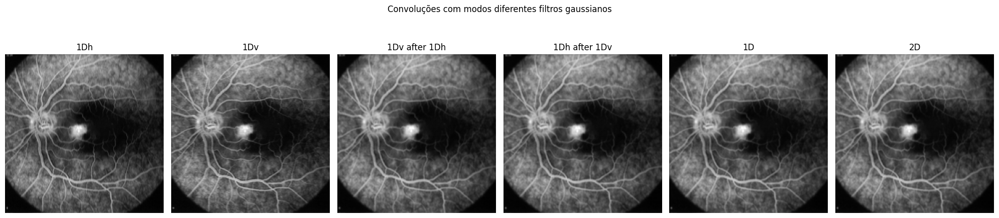

In [467]:
# Vamos aplica a convoluçao com a gaussiana 1d na imagem anterior da retina
retina_gaussiana = {}
retina_gaussiana['1Dh'] = convolve1d(f, gauss1dh, axis = 0, mode = 'wrap')
retina_gaussiana['1Dv'] = convolve1d(f, gauss1dh, axis = 1, mode = 'wrap')
retina_gaussiana['1Dv after 1Dh'] = convolve1d(retina_gaussiana['1Dh'], gauss1dh, axis = 1,mode = 'wrap')
retina_gaussiana['1Dh after 1Dv'] = convolve1d(retina_gaussiana['1Dv'], gauss1dh, axis = 0,mode = 'wrap')
retina_gaussiana['1D'] = convolve(f, gauss1d, mode = 'wrap')
retina_gaussiana['2D'] = convolve(f, gauss2d, mode = 'wrap')
n_plots = len(retina_gaussiana.keys())
fig, axs = plt.subplots(1, n_plots, figsize = (20,5));
fig.suptitle("Convoluções com modos diferentes filtros gaussianos")
for n,m in enumerate(retina_gaussiana.keys()):
    plt.subplot(1, n_plots, 1+n)
    plt.imshow(retina_gaussiana[m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
    print(f"{m}\n{retina_gaussiana[m]}\n")
fig.tight_layout()
plt.show()

O resultados acima divergem do que era esparado quando aplicado o filtro gaussiana por partes e quando aplicad oo filtro gaussiana bidimensional.
Ao mesclar as duas componentes 1Dh e 1Dv o resultado da retina é 1D quase exatamente o mesmo que ao aplicar o filtro 2D. Porém quando se aplica 1Dv e depois 1Dh e vice-versa, os resultados diferem porém diferem com uma pequena margem como se estivesse deslocado. Era esperado que fosse exatamente o mesmo que aplicar o filtro gaussiano direto. Pode-se supor que seja efeito do tratamento de borda porém nada conclusivo

### Exercício 2.2

Teste a aplicação de filtros suavizantes para redução de ruído: Adicione ruído gaussiano à imagem da retina (sugestão: use **np.random**) e depois tente remover o ruído com o filtro da média e com o filtro gaussiano. Você pode aumentar os filtros se quiser. Comente os métodos utilizados e resultados obtidos.

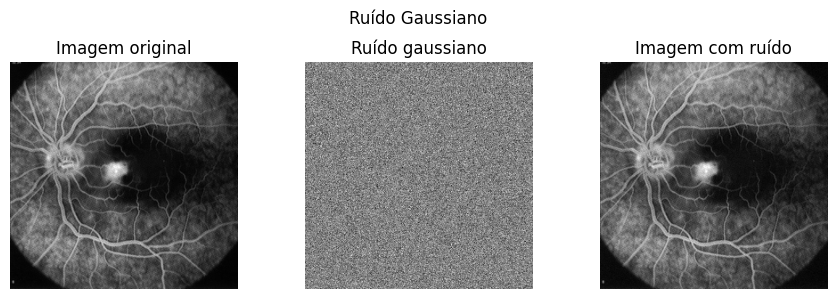

In [468]:
# Criação de ruído gaussiano
gaussian_noise = np.random.normal(0, 2, f.shape)
retina_ruido = f + gaussian_noise
fig, axs = plt.subplots(1, 3, figsize = (9,3));
fig.suptitle("Ruído Gaussiano")

plt.subplot(1, 3 , 1)
plt.imshow(f, cmap = 'gray')
plt.title("Imagem original")
plt.axis('off')
plt.subplot(1, 3 , 2)
plt.imshow(gaussian_noise, cmap = 'gray')
plt.title("Ruído gaussiano")
plt.axis('off')
plt.subplot(1, 3 , 3)
plt.imshow(retina_ruido, cmap = 'gray')
plt.title("Imagem com ruído")
plt.axis('off')

fig.tight_layout()
plt.show()

Selecionando desvio padrão = 2, o ruído não foi suficiente para ser perceptível na imagem com ruído, iremos aumentar para 100

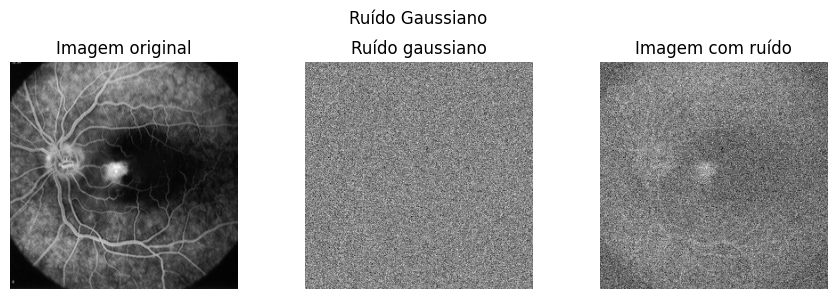

In [469]:
# Criação de ruído gaussiano
gaussian_noise = np.random.normal(0, 100, f.shape)
retina_ruido = f + gaussian_noise
fig, axs = plt.subplots(1, 3, figsize = (9,3));
fig.suptitle("Ruído Gaussiano")

plt.subplot(1, 3 , 1)
plt.imshow(f, cmap = 'gray')
plt.title("Imagem original")
plt.axis('off')
plt.subplot(1, 3 , 2)
plt.imshow(gaussian_noise, cmap = 'gray')
plt.title("Ruído gaussiano")
plt.axis('off')
plt.subplot(1, 3 , 3)
plt.imshow(retina_ruido, cmap = 'gray')
plt.title("Imagem com ruído")
plt.axis('off')

fig.tight_layout()
plt.show()

Com desvio padrão 100 se torna muito ruidosa, portando devemos diminuir um pouco para manter as caracteristicas originais

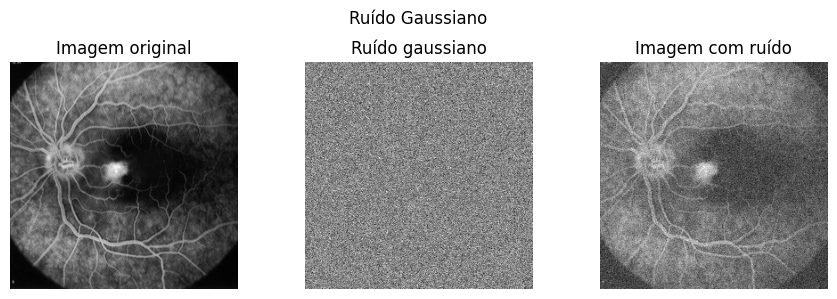

In [470]:
# Criação de ruído gaussiano
gaussian_noise = np.random.normal(0, 25, f.shape)
retina_ruido = f + gaussian_noise
fig, axs = plt.subplots(1, 3, figsize = (9,3));
fig.suptitle("Ruído Gaussiano")

plt.subplot(1, 3 , 1)
plt.imshow(f, cmap = 'gray')
plt.title("Imagem original")
plt.axis('off')
plt.subplot(1, 3 , 2)
plt.imshow(gaussian_noise, cmap = 'gray')
plt.title("Ruído gaussiano")
plt.axis('off')
plt.subplot(1, 3 , 3)
plt.imshow(retina_ruido, cmap = 'gray')
plt.title("Imagem com ruído")
plt.axis('off')

fig.tight_layout()
plt.show()

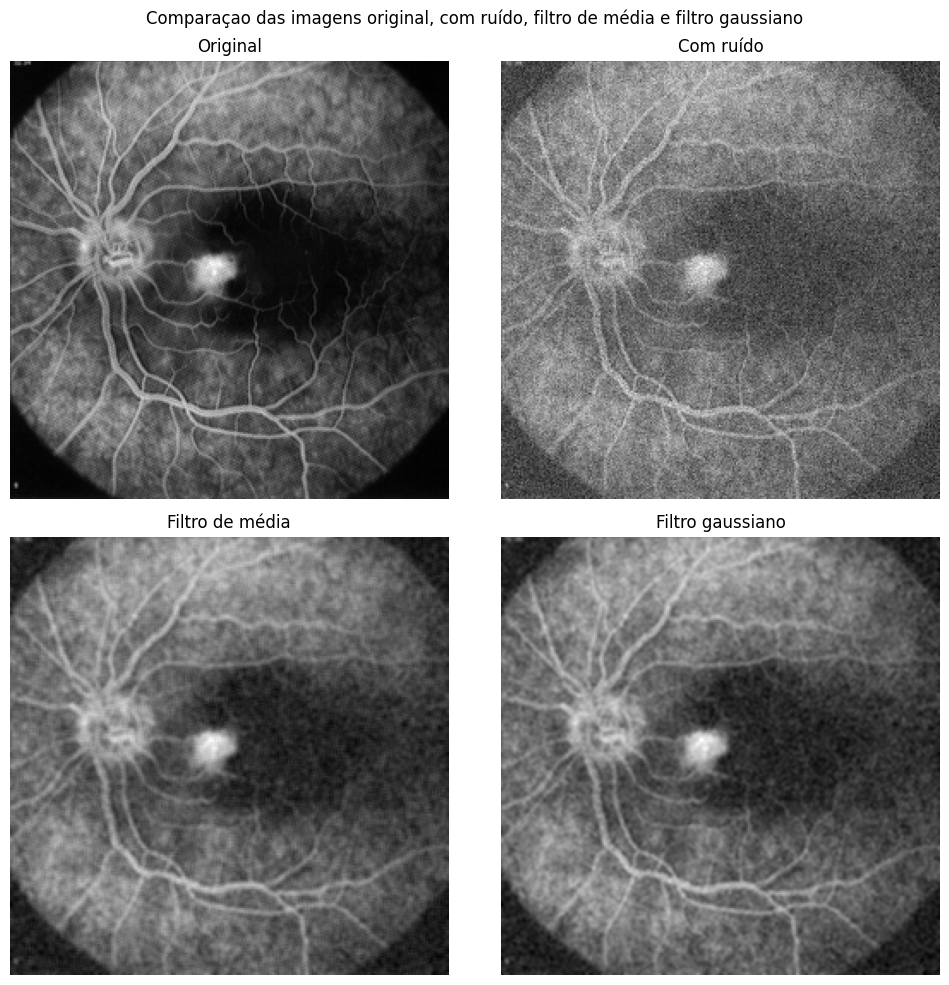

In [471]:
# Kernel de média 3x3
s = 3
media = np.ones((s,s))/(s*s)

retina_set = {}
retina_set['Original'] = f
retina_set['Com ruído'] = retina_ruido
retina_set['Filtro de média'] = convolve(retina_ruido, media)
retina_set['Filtro gaussiano'] = convolve(retina_ruido, gauss2d)

n_plots = len(retina_set .keys())
fig, axs = plt.subplots(2, 2, figsize = (10,10));
fig.suptitle("Comparaçao das imagens original, com ruído, filtro de média e filtro gaussiano")
for n,m in enumerate(retina_set .keys()):
    plt.subplot(2, 2, 1+n)
    plt.imshow(retina_set [m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
fig.tight_layout()
plt.show()

Ambos os filtros conseguiram reduzir o ruído, entretanto não foi o suficiente para remover completamente. Portanto iremos aumentar o tamanho do filtro, como no exercício 1, e comparar os resultados

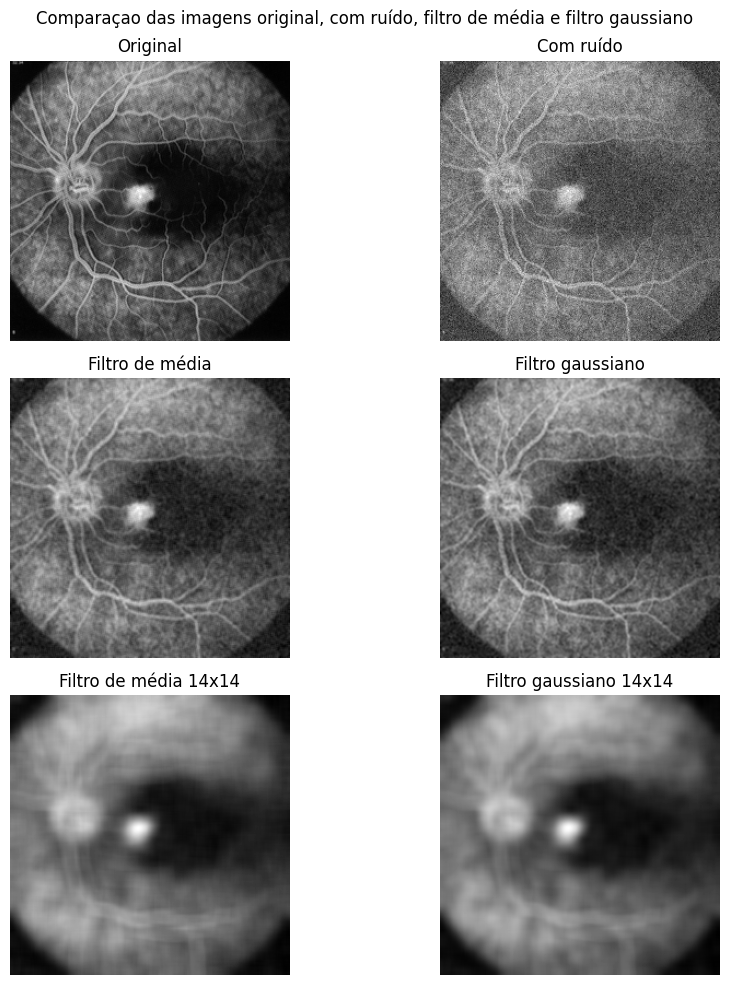

In [472]:
# Gaussiana 2D do snippet visto no notebook de filtragem
x14, y14 = np.meshgrid(np.linspace(-1,1,14), np.linspace(-1,1,14))
d14 = x14*x14+y14*y14
gauss2d14 = (1./(2.*np.pi*sigma**2)) * np.exp(-d14/(2.*sigma**2))
gauss2d14 = gauss2d14/gauss2d14.sum() # normalização

# Kernel de média 3x3
s14 = 14
media14 = np.ones((s14,s14))/(s14*s14)

retina_set['Filtro de média 14x14'] = convolve(retina_ruido, media14)
retina_set['Filtro gaussiano 14x14'] = convolve(retina_ruido, gauss2d14)

n_plots = len(retina_set .keys())
fig, axs = plt.subplots(3, 2, figsize = (10,10));
fig.suptitle("Comparaçao das imagens original, com ruído, filtro de média e filtro gaussiano")
for n,m in enumerate(retina_set .keys()):
    plt.subplot(3, 2, 1+n)
    plt.imshow(retina_set[m], cmap = 'gray')
    plt.title(m)
    plt.axis('off')
fig.tight_layout()
plt.show()

Agora com o filtro 14x14, vemos que não há resquícios do ruído gaussiano em ambos os resultados em contrapartida a nitidez da imagem piorou drasticamente. Conclui-se que ambos o filtro de média e o filtro gaussiano atingiram seus objetivos de suavizar o ruído causado na imagem.

## Parte 3 - Filtro de Sobel e detecção de bordas

Existem vários filtros que procuram realçar as bordas da imagem. Um dos mais conhecidos é o Operador Sobel, composto por uma máscara vertical (Sv) e uma máscara horizontal (Sh).

In [473]:
Sv = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
print('Sv =\n',Sv)

Sh = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
print('Sh =\n',Sh)

Sv =
 [[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]
Sh =
 [[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]


Para detectar bordas de uma imagem usando o Filtro de Sobel, precisamos fazer a filtragem da imagem usando tanto a máscara vertical, quanto a horizontal. No final, acabaremos com 2 imagens resultantes, uma reforçando as bordas verticais e outra reforçando as bordas horizontais, como exemplificado abaixo.

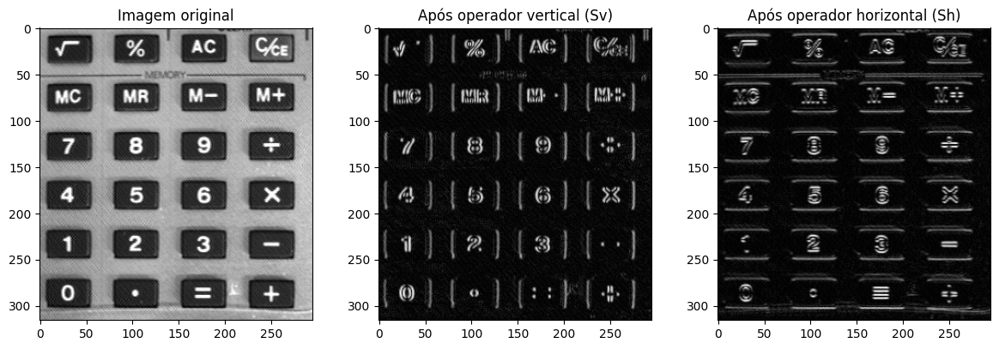

In [474]:
img = mpimg.imread(path+'keyb.tif')
img_sv = mpimg.imread(path+'keyb_sv.tif')
img_sh = mpimg.imread(path+'keyb_sh.tif')

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(img_sv,cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(img_sh,cmap='gray')
plt.title('Após operador horizontal (Sh)');

### Exercício 3.1 - Visualizando as bordas verticais e horizontais em 2 imagens separadas

Experimente filtrar as imagens abaixo com os Filtros de Sobel vertical e horizontal e visualize o resultado. Para cada imagem, você deve obter uma imagem fitrada pelo Filtro de Sobel vertical - **fv** - e uma imagem filtrada pelo Filtro de Sobel horizontal - **fh**. Comente sobre os resultados obtidos. As imagens geradas estão de acordo com o exemplo apresentado para a imagem da calculadora? Em caso negativo, explique o porquê e tente fazer com que as imagens fiquem mais semelhantes.

In [475]:
img1 = mpimg.imread(path+'retina.tif')

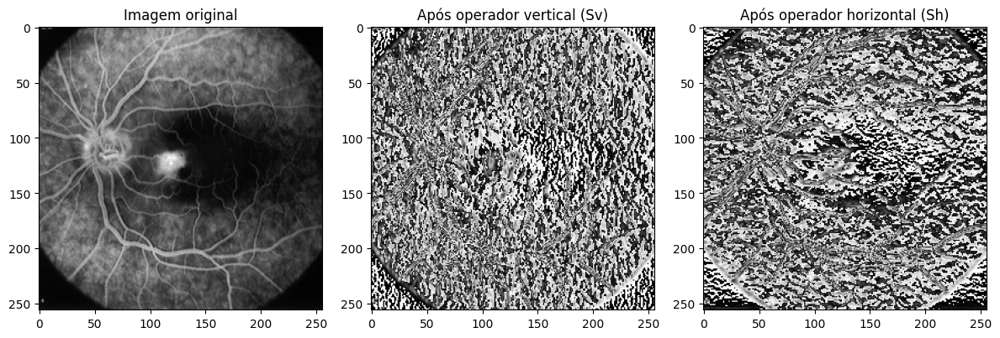

In [476]:
retina_fv = convolve(img1, Sv)
retina_fh = convolve(img1, Sh)

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img1, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(retina_fv,cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(retina_fh,cmap='gray')
plt.title('Após operador horizontal (Sh)');

Utlizando a biblioteca padrão até então de convolve, o resultado obtido não parece muito bem o que deveria ser se for comparar com os da calculadora. Pode ser um problema de overflow dos valores, portanto tentaremos incluir valores negativos na convolução

In [477]:
from scipy.signal import convolve2d

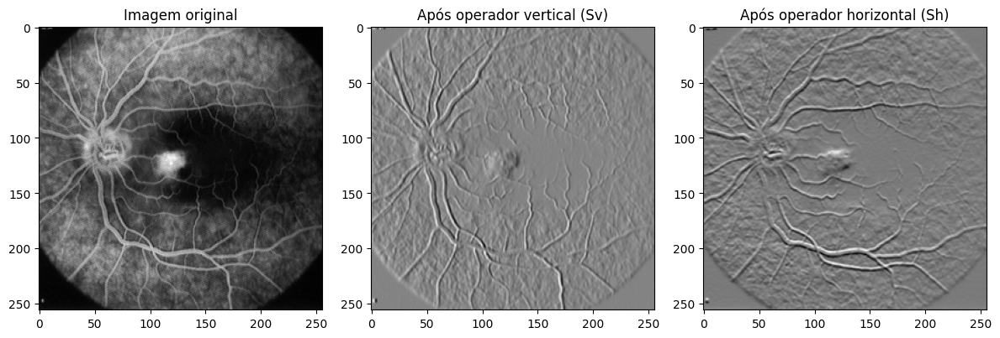

In [478]:
# Convertando para tipo inteiro 32bits para inclusão dos valores negativos e evitar overflow
retina_fv = convolve(img1.astype(np.int32), Sv)
retina_fh = convolve(img1.astype(np.int32), Sh)

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img1, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(retina_fv,cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(retina_fh,cmap='gray')
plt.title('Após operador horizontal (Sh)');

Utilizando valores negativos obtivemos melhores contornos em relação ao anterior. Isso responde a questão do porque ter aparecido ruídos anteriormente.

---

In [479]:
img2 = mpimg.imread(path+'cameraman.tif')

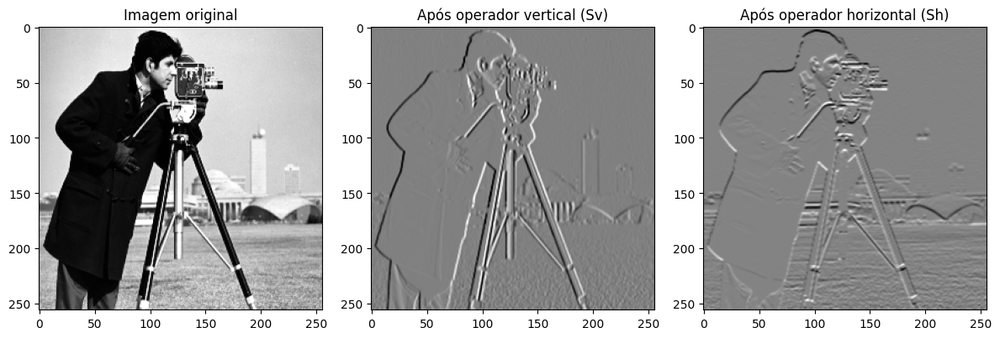

In [480]:
cameraman_fv = convolve(img2.astype(np.int32), Sv)
cameraman_fh = convolve(img2.astype(np.int32), Sh)

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img2, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(cameraman_fv,cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(cameraman_fh,cmap='gray')
plt.title('Após operador horizontal (Sh)');

Ambos os resultados do filtro de Sobel se mostraram próximas mas não o suficiente dos resultados da calculadora pois o que está faltando é o realce dos contornos, para isso podemos ampliar a magnitude das regiões de contorno e diminuir áreas que não nos interessaram (região cinza).

Como foi incluido valores negativo na imagem, quando vizualados os píxeis de intensidade negativa foram mapeados para o zero e o zero foi mapeado para um valor intermediário entre 0 e 255, o que causa o aparecimento da região cinza na imagem.

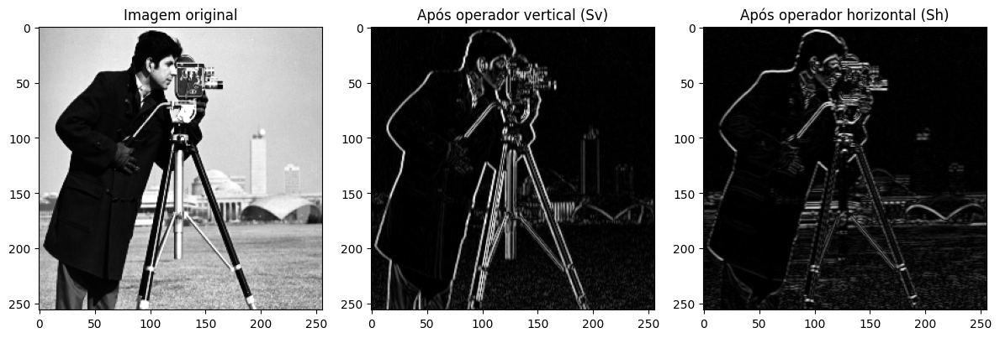

In [481]:
# source https://stackoverflow.com/questions/52913722/image-processing-the-result-of-sobel-filter-turns-out-to-be-gray-instead-of-bla
def gradMag(img):
  # Obtendo o módulo da imagem
  mag = np.sqrt(img**2)
  # Fazendo o scaling das intensidades
  mag = 255*mag/mag.max()
  return mag

fig, axs = plt.subplots(1,3, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(img2, cmap='gray')
plt.title('Imagem original')

plt.subplot(132)
plt.imshow(gradMag(cameraman_fv),cmap='gray')
plt.title('Após operador vertical (Sv)')

plt.subplot(133)
plt.imshow(gradMag(cameraman_fh),cmap='gray')
plt.title('Após operador horizontal (Sh)');

Colocando a imagem em módulo e aplicando o scaling na imagem podemos então obter o padrão visto no exemplo da calculadora, onde não há borda é preto e quando há borda é um contorno em braco.

### Exercício 3.2 - Visualizando todas as bordas em uma única imagem

Para visualizar o resultado das 2 filtragens (horizontal e vertical) em uma única imagem, utilizamos a magnitude de Sobel. A função MagSobel (a ser implementada) possui como parâmetro a imagem de entrada e deve seguir a seguinte equação:

$$MagSobel = \sqrt{f_h^2 + f_v^2}$$

onde $f_h$ é a imagem de entrada convolvida com o operador de Sobel horizontal e $f_v$ é a imagem de entrada convolvida com o operador de Sobel vertical. Crie esta função e visualize a Magnitude de Sobel das imagens utilizadas no exercício 3.1.

<ipython-input-482-b5a0bfcd4e06>:16: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(131)
<ipython-input-482-b5a0bfcd4e06>:21: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(132);


(-0.5, 255.5, 255.5, -0.5)

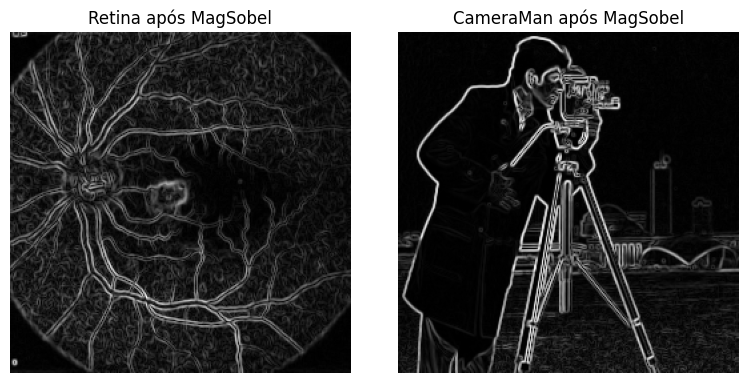

In [482]:
def magSobel(img):
  # Sobel vertical
  Sv = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
  # Sobel horizontal
  Sh = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
  fh = convolve(img.astype(np.int32),Sh)
  fv = convolve(img.astype(np.int32),Sv)
  return np.sqrt(fh**2 + fv**2)

retina_full = magSobel(img1)
cameraman_full = magSobel(img2)

fig, axs = plt.subplots(1,2, figsize=(12, 4))
plt.tight_layout()

plt.subplot(131)
plt.imshow(retina_full, cmap='gray')
plt.title('Retina após MagSobel')
plt.axis('off')

plt.subplot(132);
plt.imshow(cameraman_full, cmap='gray')
plt.title('CameraMan após MagSobel')
plt.axis('off')


Vemos que a função magSobel realizou a mesma tentativa de remover a região cinza da imagem, mostrando que ao fazer o módulo da imagem o "problema" da região cinza e mantendo as bordas da imagem portanto realçando todos os detalhes. Pricnipalmente na imagem da retina, observe como podemos ver cada contorno das veias e os detalhes no fundo dela

## Parte 4 - Aprendendo filtros com CNN (opcional para EA979)

Como vimos em sala de aula, as redes neurais convolucionais (CNNs, do inglês *convolutional neural networks*) têm como base as camadas convolucionais, um banco de filtros cujos pesos são aprendidos a partir de um gabarito para predição. Para entender melhor como isso funciona, vamos praticar com redes convolucionais bem simples e visualizar como os filtros são aprendidos por elas.

Vamos utilizar um conjunto de dados composto por 60 imagens de cidades, que servirão como entradas para a nossa rede. Além das imagens originais, temos também outros dois conjuntos de imagens, obtidos após a aplicação de dois tipos de filtros diferentes nas imagens originais (Dica: ambos os filtros aplicados foram filtros vistos anteriormente neste notebook). Essas imagens filtradas servirão como nosso gabarito para que a CNN possa aprender automaticamente qual filtro foi aplicado em cada conjunto de dados, ou seja, a rede vai tentar aprender qual o filtro necessário para obter o gabarito (imagem filtrada) a partir da entrada (imagem original).

**Para mais informações sobre redes convolucionais, exemplos e boas práticas, verifique os materiais de apoio disponibilizados no classroom. Lá você vai encontrar um tutorial teórico sobre CNN, além de tutoriais práticos disponibilizados no GitHub. Recomendamos utilizar a biblioteca PyTorch, que será utilizada novamente em exercícios futuros.**

Abaixo, visualizamos uma imagem aleatória do conjunto e suas respectivas versões filtradas.

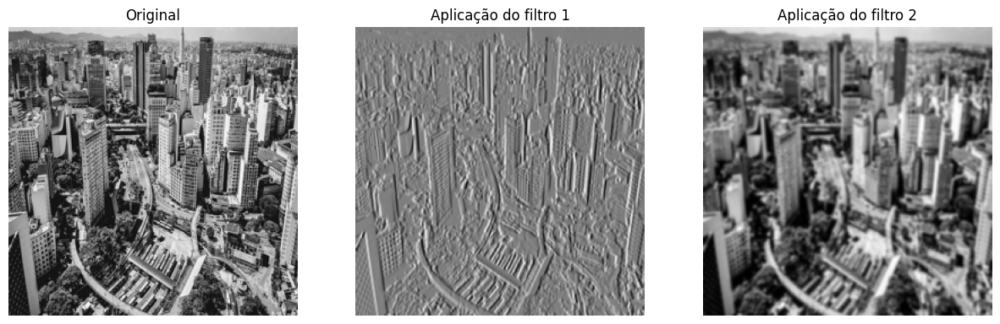

In [483]:
path_dataset = path + 'City_images/'
selec_img = random.randint(1, 60)

img_ori = Image.open(path_dataset+'imgs_originais/'+f'{selec_img}.tif')
img_f1 = Image.open(path_dataset+'imgs_filt1/'+f'{selec_img}.tif')
img_f2 = Image.open(path_dataset+'imgs_filt2/'+f'{selec_img}.tif')

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(np.array(img_ori), cmap='gray')
plt.axis('off')
plt.title('Original')
plt.subplot(132)
plt.imshow(np.array(img_f1), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 1')
plt.subplot(133)
plt.imshow(np.array(img_f2), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 2');

Para facilitar a visualização dos filtros aprendidos pela rede, vamos utilizar o código abaixo, que gera um **gif** a partir de um conjunto de arrays. Tente entender o código a partir do exemplo dado.

In [484]:
# Criando um conjunto de arrays para exemplificar o código
array_list = []
array_inicial = np.array([[0,0,0,0,0,0,0,0,0,0,0,0]]*6, dtype='uint8')
array_list.append(array_inicial)
for i in range(12):
    tmp = array_inicial.copy()
    tmp[2:4,:i+1] = 1
    array_list.append(tmp)

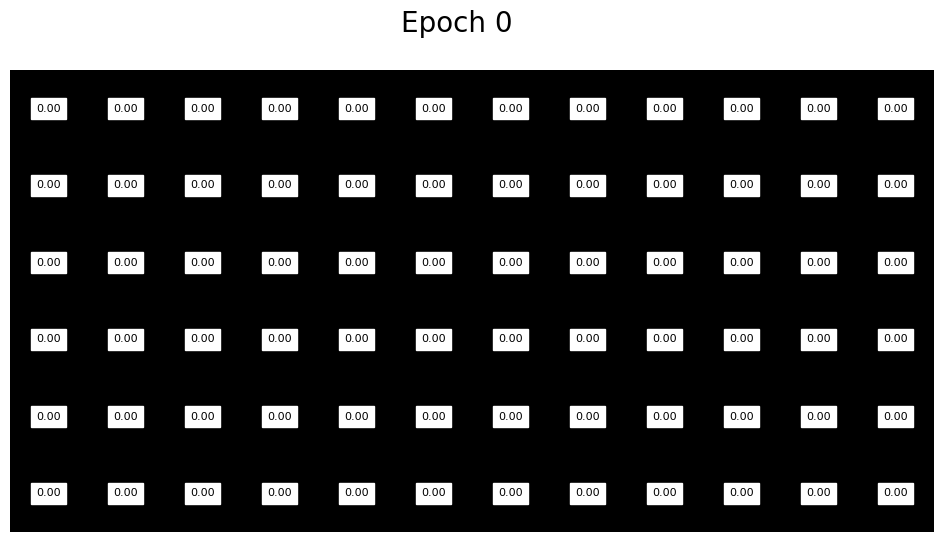

In [485]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Gif generation
images = np.array(array_list)
vmin = images.min()
vmax = images.max()
fig = plt.figure(figsize=(12,6))

# Function to update the image and add text annotations
def update(frame):
    plt.clf()  # Clear the previous plot
    fig.suptitle("Epoch {}".format(frame), fontsize=20) # Define the title
    plt.imshow(images[frame], vmin=vmin, vmax=vmax, cmap='gray') # Generate the image
    plt.axis('off')
    # Add text annotations
    for (i, j), value in np.ndenumerate(images[frame]):
        plt.text(j, i, f'{value:.2f}', ha='center', va='center', color='black', fontsize=8, backgroundcolor='white')

# Creating the animation
anim = FuncAnimation(fig, update, frames=len(images), interval=200)
# Displaying the animation in the notebook
html = anim.to_jshtml()
HTML(html)

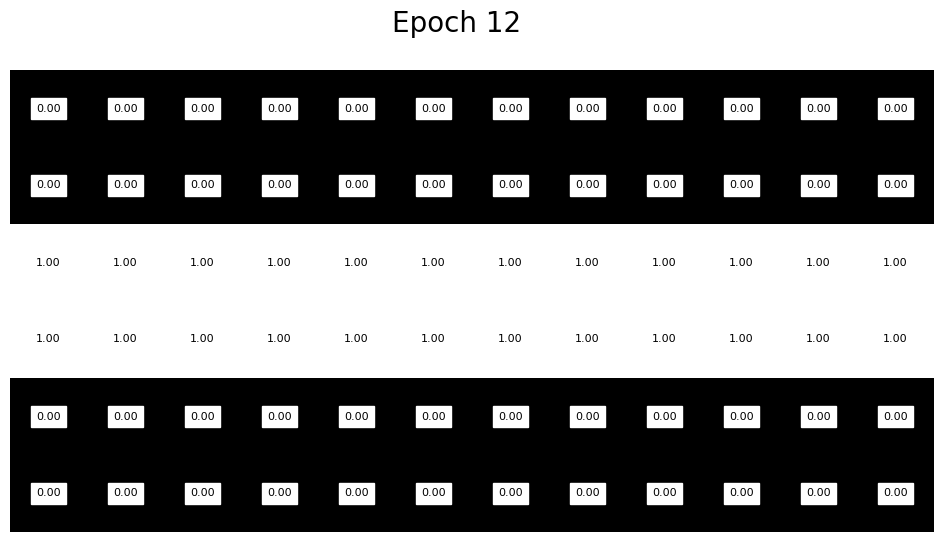

In [486]:
# Vamos criar a função generateGif  para facilitar os próximos usos

def generateGif(array_list):
  # Gif generation
  images = np.array(array_list)
  vmin = images.min()
  vmax = images.max()
  fig = plt.figure(figsize=(12,6))

  # Function to update the image and add text annotations
  def update(frame):
      plt.clf()  # Clear the previous plot
      fig.suptitle("Epoch {}".format(frame), fontsize=20) # Define the title
      plt.imshow(images[frame], vmin=vmin, vmax=vmax, cmap='gray') # Generate the image
      plt.axis('off')
      # Add text annotations
      for (i, j), value in np.ndenumerate(images[frame]):
          plt.text(j, i, f'{value:.2f}', ha='center', va='center', color='black', fontsize=8, backgroundcolor='white')

  # Creating the animation
  anim = FuncAnimation(fig, update, frames=len(images), interval=200)
  # Displaying the animation in the notebook
  html = anim.to_jshtml()

  return html
HTML(generateGif(array_list))

### Exercício 4.1

Crie uma CNN composta por apenas uma camada convolucional com kernel de tamanho 3x3, que utilize as imagens originais como entrada e tenha como "gabarito" o primeiro conjunto de imagens filtradas (**imgs_filt1**). Você precisará definir uma função de loss, um otimizador para a rede e o número de épocas para treinamento. Então, treine a rede com as imagens especificadas, acompanhando os valores de loss a cada época. Você deve armazenar em uma lista os pesos do kernel da rede a cada época do treinamento.

Após o treinamento, visualize a progressão dos pesos do kernel utilizando o código de geração de **gif** dado anteriormente. Comente os métodos utilizados e resultados obtidos. A partir do **gif** obtido, você é capaz de dizer que filtro foi utilizado para gerar o conjunto de imagens da pasta **imgs_filt1**?

In [487]:
# https://pytorch.org/tutorials/beginner/data_loading_tutorial.html
# https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html#training-an-image-classifier
import os
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch import tensor
from torchvision.transforms import ToTensor

In [488]:
path_dataset = path + 'City_images/'

# Primeiramente iremos carregar as imagens, veja que as imagens estão foras de ordem portanto teremos que carrega-las em ordem crescente utilizando indice
# para definir o caminho da imagem a ser carregada

print(os.listdir(path_dataset+'imgs_originais/'))

img_ori = [Image.open(path_dataset+'imgs_originais/'+f'{i+1}.tif') for i in range(len(os.listdir(path_dataset+'imgs_originais/')))]
img_f1 = [Image.open(path_dataset+'imgs_filt1/'+f'{i+1}.tif') for i in range(len(os.listdir(path_dataset+'imgs_filt1/')))]
img_f2 = [Image.open(path_dataset+'imgs_filt2/'+f'{i+1}.tif') for i in range(len(os.listdir(path_dataset+'imgs_filt2/')))]


['4.tif', '24.tif', '19.tif', '20.tif', '9.tif', '23.tif', '1.tif', '18.tif', '13.tif', '22.tif', '3.tif', '27.tif', '25.tif', '2.tif', '21.tif', '10.tif', '7.tif', '16.tif', '11.tif', '6.tif', '14.tif', '12.tif', '8.tif', '26.tif', '17.tif', '15.tif', '5.tif', '28.tif', '40.tif', '29.tif', '32.tif', '37.tif', '39.tif', '33.tif', '30.tif', '42.tif', '34.tif', '38.tif', '36.tif', '35.tif', '31.tif', '41.tif', '47.tif', '48.tif', '44.tif', '46.tif', '43.tif', '45.tif', '53.tif', '59.tif', '60.tif', '52.tif', '58.tif', '55.tif', '54.tif', '50.tif', '56.tif', '51.tif', '49.tif', '57.tif']


In [489]:
# Iremos criar o nosso modelo de CNN com apenas uma camada convolucional de kernel 3x3
# o modelo irá aprender a definir os weights dentro do módulo nn.Conv2d

class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=3, padding=1)

    def forward(self, x):
        x = self.conv1(x)
        return x

In [490]:
# Função para converter PIL em tensor para criar o nosso dataset

transform = transforms.Compose(
    [transforms.ToTensor()])

tensor_ori = [transform(img) for img in img_ori]
tensor_f1 = [transform(img) for img in img_f1]
tensor_f2 = [transform(img) for img in img_f2]

# Vamos zippar o nosso conjunto para treino e nosso gabarito tensor_f1
trainset = list(zip(tensor_ori, tensor_f1))

# Com base em https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
# iremos gerar nosso conjunto de treinamento com batch_size = 1
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1, shuffle = True)

# Ireimos iniciar o modelo
# o criterio definido será de regressão linear MSE e otimizador SGD
net = Net()
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [491]:
# Lista para guardar os kernels gerados no treinamento
learned_filter = []


for epoch in range(50):  # loop over the dataset multiple times

    running_loss = 0.0

    # Input e label são respectivamente nossas imagens originais e imagens filtradas 1
    for input, label in trainloader:

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(input)
        loss = criterion(outputs, label)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f'Epoch [{epoch}] loss: {running_loss/len(tensor_ori):.6f}')

    # Armazenando na lista os weights de cada época
    learned_filter.append(net.conv1.weight.data.clone()[0,0])
print('Finished Training')
print(learned_filter)

Epoch [0] loss: 0.235491
Epoch [1] loss: 0.194406
Epoch [2] loss: 0.185412
Epoch [3] loss: 0.177107
Epoch [4] loss: 0.169222
Epoch [5] loss: 0.161789
Epoch [6] loss: 0.154668
Epoch [7] loss: 0.148027
Epoch [8] loss: 0.141673
Epoch [9] loss: 0.135721
Epoch [10] loss: 0.130048
Epoch [11] loss: 0.124679
Epoch [12] loss: 0.119617
Epoch [13] loss: 0.114762
Epoch [14] loss: 0.110243
Epoch [15] loss: 0.105919
Epoch [16] loss: 0.101850
Epoch [17] loss: 0.097954
Epoch [18] loss: 0.094319
Epoch [19] loss: 0.090823
Epoch [20] loss: 0.087547
Epoch [21] loss: 0.084448
Epoch [22] loss: 0.081481
Epoch [23] loss: 0.078684
Epoch [24] loss: 0.076059
Epoch [25] loss: 0.073540
Epoch [26] loss: 0.071163
Epoch [27] loss: 0.068922
Epoch [28] loss: 0.066779
Epoch [29] loss: 0.064765
Epoch [30] loss: 0.062855
Epoch [31] loss: 0.061045
Epoch [32] loss: 0.059334
Epoch [33] loss: 0.057695
Epoch [34] loss: 0.056164
Epoch [35] loss: 0.054696
Epoch [36] loss: 0.053312
Epoch [37] loss: 0.052007
Epoch [38] loss: 0.050

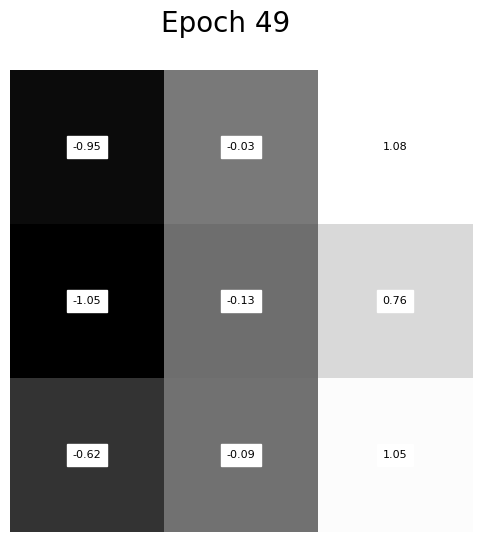

In [492]:

HTML(generateGif(learned_filter))


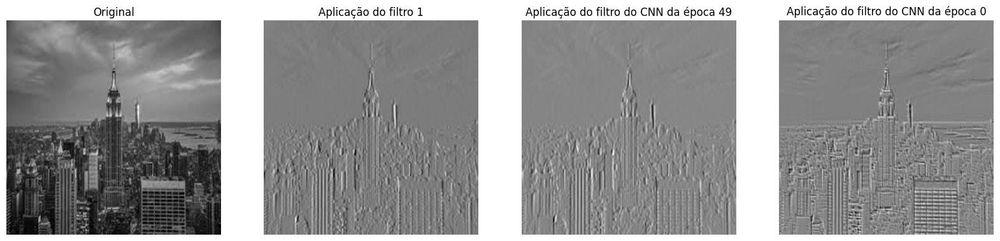

In [495]:
# Iremos testar se o kernel funcionou, utilizando uma imagem aleatória de teste
selec_img = random.randint(1, 60)
img_ori = Image.open(path_dataset+'imgs_originais/'+f'{selec_img}.tif')
img_f1 = Image.open(path_dataset+'imgs_filt1/'+f'{selec_img}.tif')
img_f2 = Image.open(path_dataset+'imgs_filt2/'+f'{selec_img}.tif')

plt.figure(figsize=(20,5))
plt.subplot(141)
plt.imshow(np.array(img_ori), cmap='gray')
plt.axis('off')
plt.title('Original')
plt.subplot(142)
plt.imshow(np.array(img_f1), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 1')
plt.subplot(143)
plt.imshow(convolve(img_ori, learned_filter[49]), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro do CNN da época 49')
plt.subplot(144)
plt.imshow(convolve(img_ori, learned_filter[0]), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro do CNN da época 0')
plt.show()

Conforme o resultado acima, o filtro treinado parece ser próximo da aplicação do filtro 1 entretanto se olhar atentamente as bordas parecem estar invertidas, isto é onde está branco no filtro 1, é preto no filtro CNN. Além disso vemos que desde a época 0 a imagem já estava próxima do filtro 1 faltando pequenos ajustes que foram obtidos na época 49

### Exercício 4.2

Repita o processo realizado no exercício 5.1, mas dessa vez crie uma CNN composta por duas camadas convolucionais, a primeira com kernel de tamanho 1x5 e a segunda com kernel de tamanho 5x1. Você deve utilizar como "gabarito" o segundo conjunto de imagens filtradas (**imgs_filt2**). Armazene os pesos dos kernels da rede a cada época do treinamento em duas listas, uma para cada kernel.

Após o treinamento, visualize a progressão dos pesos de cada kernel utilizando o código de geração de **gif** dado anteriormente. Comente os métodos utilizados e resultados obtidos. A partir dos **gifs** obtidos, você é capaz de dizer que filtro foi utilizado para gerar o conjunto de imagens da pasta **imgs_filt2**?

In [496]:
# Iremos criar o nosso modelo de CNN com apenas uma camada convolucional de kernel 3x3
# o modelo irá aprender a definir os weights dentro do módulo nn.Conv2d

class Net2(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=(1,5), padding=1)
        self.conv2 = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=(5,1), padding=1)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return x

In [497]:

# Lista para guardar os kernels gerados no treinamento
learned_filter_h = []
learned_filter_v = []
# Vamos zippar o nosso conjunto para treino e nosso gabarito tensor_f1
trainset2 = list(zip(tensor_ori, tensor_f2))

# Com base em https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
# iremos gerar nosso conjunto de treinamento com batch_size = 1
trainloader2 = torch.utils.data.DataLoader(trainset2, batch_size=1, shuffle = True)

net2 = Net2()
criterion2 = nn.MSELoss()
optimizer2 = optim.SGD(net2.parameters(), lr=0.001, momentum=0.9)

In [498]:
for epoch in range(50):  # loop over the dataset multiple times

    running_loss = 0.0

    # Input e label são respectivamente nossas imagens originais e imagens filtradas 1
    for input, label in trainloader2:

        # zero the parameter gradients
        optimizer2.zero_grad()

        # forward + backward + optimize
        outputs = net2(input)
        loss = criterion2(outputs, label)
        loss.backward()
        optimizer2.step()
        running_loss += loss.item()

    print(f'Epoch [{epoch}] loss: {running_loss/len(tensor_ori):.6f}')

    # Armazenando na lista os weights de cada época
    learned_filter_h.append(net2.conv1.weight.data.clone()[0,0])
    # Armazenando na lista os weights de cada época
    learned_filter_v.append(net2.conv2.weight.data.clone()[0,0])
print('Finished Training')
print(learned_filter_h)

Epoch [0] loss: 0.047017
Epoch [1] loss: 0.038868
Epoch [2] loss: 0.036075
Epoch [3] loss: 0.032449
Epoch [4] loss: 0.029151
Epoch [5] loss: 0.025826
Epoch [6] loss: 0.022915
Epoch [7] loss: 0.020224
Epoch [8] loss: 0.017563
Epoch [9] loss: 0.015454
Epoch [10] loss: 0.013646
Epoch [11] loss: 0.012185
Epoch [12] loss: 0.010967
Epoch [13] loss: 0.010094
Epoch [14] loss: 0.009304
Epoch [15] loss: 0.008738
Epoch [16] loss: 0.008290
Epoch [17] loss: 0.007927
Epoch [18] loss: 0.007637
Epoch [19] loss: 0.007416
Epoch [20] loss: 0.007226
Epoch [21] loss: 0.007064
Epoch [22] loss: 0.006927
Epoch [23] loss: 0.006801
Epoch [24] loss: 0.006690
Epoch [25] loss: 0.006588
Epoch [26] loss: 0.006490
Epoch [27] loss: 0.006398
Epoch [28] loss: 0.006310
Epoch [29] loss: 0.006226
Epoch [30] loss: 0.006146
Epoch [31] loss: 0.006065
Epoch [32] loss: 0.005988
Epoch [33] loss: 0.005914
Epoch [34] loss: 0.005841
Epoch [35] loss: 0.005771
Epoch [36] loss: 0.005703
Epoch [37] loss: 0.005635
Epoch [38] loss: 0.005

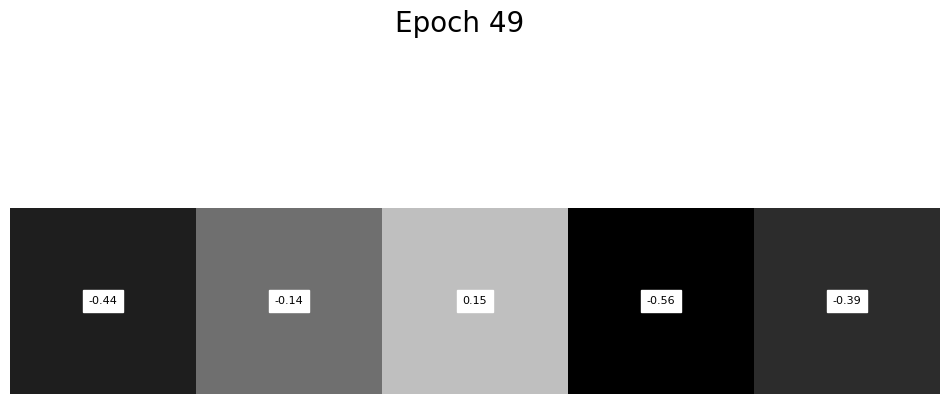

In [499]:
HTML(generateGif(learned_filter_h))

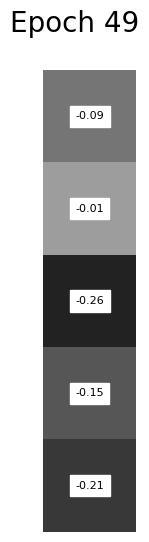

In [500]:
HTML(generateGif(learned_filter_v))

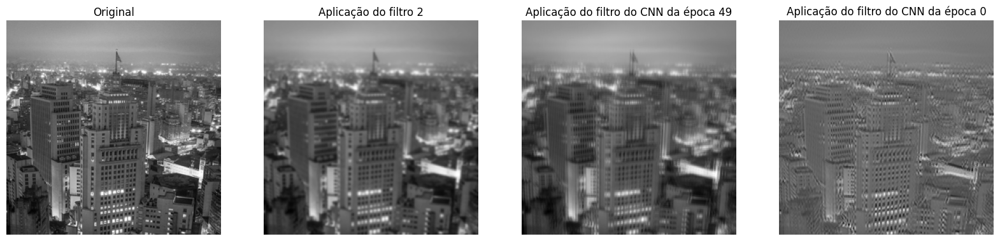

In [501]:
# Vamos testar o filtro treinado e verificar se parece com a imagem aleatoriamente selecionado do conjunto filt2
# Iremos testar se o kernel funcionou, utilizando uma imagem aleatória de teste
selec_img = random.randint(1, 60)
img_ori = Image.open(path_dataset+'imgs_originais/'+f'{selec_img}.tif')
img_f2 = Image.open(path_dataset+'imgs_filt2/'+f'{selec_img}.tif')
net2_conv_epoch_14 = convolve(img_ori, learned_filter_h[49])
net2_conv_epoch_14 = convolve(net2_conv_epoch_14, learned_filter_v[49])
net2_conv_epoch_0 = convolve(img_ori, learned_filter_h[0])
net2_conv_epoch_0 = convolve(net2_conv_epoch_0, learned_filter_v[0])
plt.figure(figsize=(20,5))
plt.subplot(141)
plt.imshow(np.array(img_ori), cmap='gray')
plt.axis('off')
plt.title('Original')
plt.subplot(142)
plt.imshow(np.array(img_f2), cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro 2')
plt.subplot(143)
plt.imshow(net2_conv_epoch_14, cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro do CNN da época 49')
plt.subplot(144)
plt.imshow(net2_conv_epoch_0 , cmap='gray')
plt.axis('off')
plt.title('Aplicação do filtro do CNN da época 0')
plt.show()

Comparado com o filtro da época 0, é incontestável que não é o mesmo filtro sendo aplicado. Porém na época 50 já podemos ver que as duas estão quase semelhantes, sendo o filtro 2 nítido e no filtro treinado parece que a imagem está tremida.

Com a imagem do gif podemos supor que seja um filtro Sobel horizontal com filtro Gaussiano pois na componente (5x1) o meio é o valor mais baixo assim como o filtro de Sobel Gx e na componente (1x5) o centro é o valor mais alto como um filtro Gaussiano unidimensional.